# Data Visualization Gomycode Checkpoint

Data visualization is a key part of the data science lifecycle. This enables us to quickly identify patterns, make sense of raw data, and communicate results to different stakeholders.

This notebook uses the African climate change dataset to do the data-wrangling process and plot the charts using plotly. It contains daily recorded temperature and precipitation changes for 5 countries (Tunisia, Cameroon, Senegal, Angola, Egypt). It is ideal for anyone interested in learning data visualization techniques and enthusiasts interested in data science. However, the data hasn't been verified and it's use here is purely for practicing purposes hence if you intend to use it, do it with caution!

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

### Step 1 - Load and show the overview of the dataset

In [2]:
climate_df = pd.read_csv('datasets/Africa_climate_change.csv')
df = climate_df.copy()
df.head()

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia
1,19800101 000000,NaN,49.0,55.0,41.0,Tunisia
2,19800101 000000,0.0,72.0,86.0,59.0,Cameroon
3,19800101 000000,NaN,50.0,55.0,43.0,Tunisia
4,19800101 000000,NaN,75.0,91.0,NaN,Cameroon


In [3]:
df.shape #The dataframe has 464,815 rows/observations and 6 columns/features

(464815, 6)

The dataframe seems to have different column datatypes and missing values on most of the columns specifically, prcp (precipitation - water falling from the sky), tavg (temperature average hourly values) , tmax (maximum hourly temperature), tmin (minimum hourly temperature).

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464815 entries, 0 to 464814
Data columns (total 6 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   DATE     464815 non-null  object 
 1   PRCP     177575 non-null  float64
 2   TAVG     458439 non-null  float64
 3   TMAX     363901 non-null  float64
 4   TMIN     332757 non-null  float64
 5   COUNTRY  464815 non-null  object 
dtypes: float64(4), object(2)
memory usage: 21.3+ MB


In [5]:
#Check the overview of the statistical analysis of the dataframe columns
df.describe(include='all')

,DATE,PRCP,TAVG,TMAX,TMIN,COUNTRY
count,464815,177575.000000,458439.000000,363901.000000,332757.000000,464815
unique,15938,NaN,NaN,NaN,NaN,5
top,20150619 000000,NaN,NaN,NaN,NaN,Senegal
freq,37,NaN,NaN,NaN,NaN,183262
mean,NaN,0.120941,77.029838,88.713969,65.548262,NaN
std,NaN,0.486208,11.523634,13.042631,11.536547,NaN
min,NaN,0.000000,-49.000000,41.000000,12.000000,NaN
25%,NaN,0.000000,70.000000,81.000000,58.000000,NaN
50%,NaN,0.000000,80.000000,90.000000,68.000000,NaN
75%,NaN,0.010000,85.000000,99.000000,74.000000,NaN


In [6]:
#convert columns to lower case
df.columns = df.columns.str.strip().str.lower()
df.head(1)

,date,prcp,tavg,tmax,tmin,country
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia


### Step 2 - Handle missing values and outliers

In [7]:
#check missing value counts
df.isnull().sum()

date            0
prcp       287240
tavg         6376
tmax       100914
tmin       132058
country         0
dtype: int64

#### 2.1 Handle PRCP missing values

In [8]:
#check some of the prcp values recored
df[df.prcp.notna()].sample(10)

,date,prcp,tavg,tmax,tmin,country
267404,20060718 000000,0.00,81.0,89.0,74.0,Tunisia
49362,19850722 000000,0.00,80.0,84.0,NaN,Senegal
360853,20140806 000000,0.00,79.0,90.0,NaN,Tunisia
234987,20030927 000000,0.00,75.0,84.0,66.0,Tunisia
113278,19920320 000000,0.00,55.0,61.0,48.0,Egypt
304530,20091105 000000,0.00,67.0,NaN,54.0,Tunisia
187332,19981202 000000,0.00,49.0,60.0,23.0,Tunisia
426156,20191230 000000,0.02,49.0,57.0,37.0,Tunisia
332567,20120220 000000,0.00,53.0,60.0,44.0,Egypt
236390,20031113 000000,0.00,70.0,78.0,62.0,Egypt


In [9]:
missing_prcp = df[df.prcp.isnull()]
missing_prcp.head()

,date,prcp,tavg,tmax,tmin,country
0,19800101 000000,NaN,54.0,61.0,43.0,Tunisia
1,19800101 000000,NaN,49.0,55.0,41.0,Tunisia
3,19800101 000000,NaN,50.0,55.0,43.0,Tunisia
4,19800101 000000,NaN,75.0,91.0,NaN,Cameroon
5,19800101 000000,NaN,52.0,61.0,45.0,Tunisia


In [10]:
#Get the unique number of dates to know whether the prcp values should be the recorded occurrences for each date or should be general eg using the mode, mean or median
len(df.date.unique()) #returns 15938 unique dates which is quite high
prcp_mode = df.prcp.mode() #returns the mode as 0
prcp_mean = format(df.prcp.mean(), ".2f") #returns 0.12
prcp_mode, prcp_mean

(0    0.0
 Name: prcp, dtype: float64,
 '0.12')

In [11]:
mode_occurrences = df[df.prcp == 0].prcp.value_counts()
mode_occurrences_percentage = mode_occurrences / df.shape[0] * 100
mode_occurrences, mode_occurrences_percentage

(prcp
 0.0    133052
 Name: count, dtype: int64,
 prcp
 0.0    28.624722
 Name: count, dtype: float64)

In [12]:
#Given the mode only accounts for 28% of the values in the prcp column, a high percentage has values hence we'll use the mean to fill in the missing values
df.loc[df[df.prcp.isnull()].index, 'prcp'] = float(prcp_mean)

In [13]:
df.prcp.isnull().sum() #the prcp null values are 0, so we've successfully filled in the missing values.

np.int64(0)

#### 2.2 Handle missing tavg values

In [14]:
#check some of the tavg values recored
df[df.tavg.notna()].sample(10)

,date,prcp,tavg,tmax,tmin,country
292185,20081103 000000,0.00,69.0,78.0,60.0,Tunisia
94332,19900407 000000,0.12,77.0,96.0,NaN,Senegal
338449,20120815 000000,0.55,81.0,87.0,72.0,Cameroon
197267,19991122 000000,0.12,84.0,92.0,74.0,Senegal
29333,19830426 000000,0.12,67.0,78.0,58.0,Egypt
418200,20190403 000000,0.12,82.0,101.0,72.0,Senegal
422624,20190831 000000,0.12,81.0,NaN,NaN,Cameroon
234835,20030922 000000,0.03,85.0,92.0,77.0,Senegal
301005,20090724 000000,0.12,83.0,88.0,79.0,Senegal
436321,20201220 000000,0.54,58.0,65.0,55.0,Tunisia


In [15]:
#check the missing tavg value
missing_tavg = df[df.tavg.isnull()]
missing_tavg.head()

,date,prcp,tavg,tmax,tmin,country
20,19800101 000000,0.0,NaN,NaN,NaN,Angola
24,19800101 000000,0.0,NaN,94.0,62.0,Senegal
26,19800102 000000,0.0,NaN,94.0,62.0,Senegal
35,19800102 000000,0.0,NaN,NaN,NaN,Angola
55,19800103 000000,0.0,NaN,NaN,NaN,Angola


In [16]:
#Get the tavg statistical values ie the mode, mean or median
tavg_mode = df.tavg.mode() #returns the mode as 83
tavg_mean = df.tavg.mean() #returns 77.03
tavg_mode, tavg_mean

(0    83.0
 Name: tavg, dtype: float64,
 np.float64(77.02983821184498))

In [17]:
#Fill in the missing values using the mean since the data seems to be evenly distributed
#df.tavg.fillna(float(format(tavg_mean, '.2f')), inplace = True)
df.tavg = df.tavg.fillna(float(format(tavg_mean, '.2f')))
#df.loc[df.tavg.isnull().index, 'tavg'] = float(format(tavg_mean, '.2f'))

In [18]:
df.tavg.isnull().sum()

np.int64(0)

#### 2.3 Fill in missing tmax and tmin values

In [19]:
#check some of the tavg values recored
df[df.tmax.notna() & df.tmin.notna()].sample(10)

,date,prcp,tavg,tmax,tmin,country
17449,19811225 000000,0.00,71.0,81.0,63.0,Senegal
18577,19820211 000000,0.12,55.0,66.0,45.0,Egypt
397180,20170630 000000,0.00,84.0,90.0,76.0,Senegal
438409,20210309 000000,0.20,57.0,65.0,51.0,Tunisia
65784,19870604 000000,0.12,82.0,86.0,78.0,Senegal
11026,19810327 000000,0.12,61.0,77.0,45.0,Tunisia
170306,19970518 000000,0.00,89.0,108.0,68.0,Egypt
140416,19940927 000000,0.02,83.0,92.0,75.0,Senegal
22858,19820805 000000,0.12,83.0,96.0,73.0,Senegal
129570,19931003 000000,0.04,80.0,87.0,71.0,Cameroon


In [20]:
#check the missing tmax and tmin values
missing_tmax = df[df.tmax.isnull()]
missing_tmin = df[df.tmin.isnull()]
missing_tavg.head()

,date,prcp,tavg,tmax,tmin,country
20,19800101 000000,0.0,NaN,NaN,NaN,Angola
24,19800101 000000,0.0,NaN,94.0,62.0,Senegal
26,19800102 000000,0.0,NaN,94.0,62.0,Senegal
35,19800102 000000,0.0,NaN,NaN,NaN,Angola
55,19800103 000000,0.0,NaN,NaN,NaN,Angola


In [21]:
missing_tmin.head()

,date,prcp,tavg,tmax,tmin,country
4,19800101 000000,0.12,75.00,91.0,NaN,Cameroon
11,19800101 000000,0.12,84.00,99.0,NaN,Senegal
14,19800101 000000,0.12,86.00,97.0,NaN,Senegal
20,19800101 000000,0.00,77.03,NaN,NaN,Angola
22,19800101 000000,0.00,84.00,91.0,NaN,Cameroon


In [22]:
#Get the tmax statistical values ie the mode, mean or median
tmax_mode = df.tmax.mode() #returns the mode as 90
tmax_mean = df.tmax.mean() #returns 88.71
tmax_mode, tmax_mean

(0    90.0
 Name: tmax, dtype: float64,
 np.float64(88.71396890912638))

In [23]:
#Get the tmin statistical values ie the mode, mean or median
tmin_mode = df.tmin.mode() #returns the mode as 72
tmin_mean = df.tmin.mean() #returns 65.54
tmin_mode, tmin_mean

(0    72.0
 Name: tmin, dtype: float64,
 np.float64(65.54826194490273))

In [24]:
#Fill in the missing values using the mean since the data seems to be evenly distributed for both tmax and tmin
df.tmax = df.tmax.fillna(float(format(tmax_mean, '.2f')))
df.tmin = df.tmin.fillna(float(format(tmin_mean, '.2f')))

In [25]:
df.tmax.isnull().sum(), df.tmin.isnull().sum()

(np.int64(0), np.int64(0))

In [26]:
df.isnull().sum() #We have successfully filled in the missing values

date       0
prcp       0
tavg       0
tmax       0
tmin       0
country    0
dtype: int64

### Step 3. Generate some visualization charts

#### 3.1 Plot a line chart to show the average temperature fluctuations in Tunisia and Cameroon. Interpret the results.

In [27]:
#Convert the date column into datetime field
df.date = pd.to_datetime(df.date)
df.head()

,date,prcp,tavg,tmax,tmin,country
0,1980-01-01,0.12,54.0,61.0,43.00,Tunisia
1,1980-01-01,0.12,49.0,55.0,41.00,Tunisia
2,1980-01-01,0.00,72.0,86.0,59.00,Cameroon
3,1980-01-01,0.12,50.0,55.0,43.00,Tunisia
4,1980-01-01,0.12,75.0,91.0,65.55,Cameroon


In [28]:
#Extract the year from the dates and create new column to store them - #Put the flactuations to be annual rather than daily - year with the lowest & highest temperature
df['year'] = df.date.dt.year
df.head(1)

,date,prcp,tavg,tmax,tmin,country,year
0,1980-01-01,0.12,54.0,61.0,43.0,Tunisia,1980


In [29]:
#Get the annual average temperatures in Cameroon and Tunisia
avg_tun_cam_tmp = df[(df.country == 'Tunisia') | (df.country == 'Cameroon')].groupby(['year', 'country'])['tavg'].mean().reset_index()
avg_tun_cam_tmp.head()

,year,country,tavg
0,1980,Cameroon,78.263660
1,1980,Tunisia,64.865427
2,1981,Cameroon,78.163377
3,1981,Tunisia,65.981908
4,1982,Cameroon,77.375319


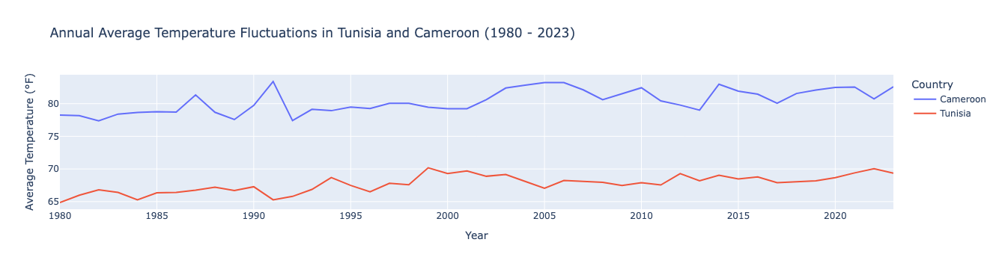

In [41]:
#Line chart to show the average temperature fluctuations in Tunisia and Cameroon
fig = px.line(avg_tun_cam_tmp, y = 'tavg', x = 'year', title='Annual Average Temperature Fluctuations in Tunisia and Cameroon (1980 - 2023)', 
              color='country')
fig.update_layout(xaxis_title='Year', yaxis_title='Average Temperature (°F)', legend_title_text='Country')
fig.show()

#### Interpretations of the temperature fluctuations in Tunisia and Cameroon

1. Cameroon has experienced higher average annual temperatures in comparison to Tunisia.

2. Cameroon experienced the highest average temperatures in 1991 with an annual average of 83.4 with the lowest average temperatures in 1992 with an annual average of 77.41.

3. Tunisia's highest average temperature recorded was in 1999 with recordings averaging 70.18 with the lowest temperature recordings in 1980 with an average of 64.86.

4. The temperature has gradually become hotter since 1990 in both countries.

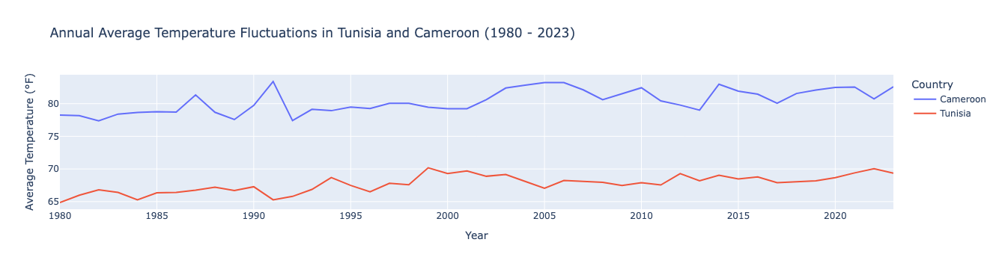

In [42]:
#Line chart to show the average temperature fluctuations in Tunisia and Cameroon
#Zoom in to only include data between 1980 and 2005
fig = px.line(avg_tun_cam_tmp, y = 'tavg', x = 'year', title='Annual Average Temperature Fluctuations in Tunisia and Cameroon (1980 - 2023)', 
              color='country')
fig.update_layout(xaxis_title='Year', yaxis_title='Average Temperature (°F)', legend_title_text='Country')
fig.show()

#### 3.2 Histogram to show temperature distribution in Senegal between (1980-2000) and (2000,2023)

In [43]:
senegal_temp_distribution = df[df.country.str.lower() == 'senegal']

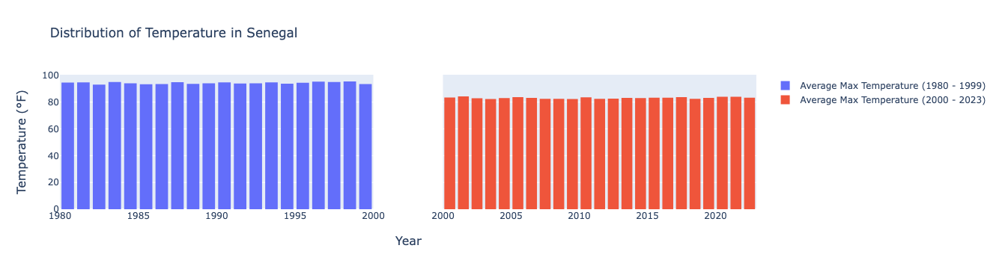

In [44]:
# Histogram to show the temperature distribution in Senegal
fig = make_subplots(rows=1, cols=2, shared_xaxes=True, shared_yaxes=True, x_title='Year', y_title='Temperature (°F)')
trace_1900s = go.Histogram(
    histfunc='avg', 
    x=senegal_temp_distribution.year, 
    y=senegal_temp_distribution.tmax, 
    xbins=dict(start='1980', end='2000'), 
    name='Average Max Temperature (1980 - 1999)'
)

trace_2000s = go.Histogram(histfunc='avg', x=senegal_temp_distribution.year, y=senegal_temp_distribution.tavg, xbins=dict(start='2000', end='2023'), name='Average Max Temperature (2000 - 2023)')

fig.append_trace(trace_1900s, 1, 1)
fig.append_trace(trace_2000s, 1, 2)

fig.update_layout(title='Distribution of Temperature in Senegal', bargap=0.2)
fig.show()

#### Interpretation of the temperature distribution in Senegal
The average temperature in Senegal has reduced from the 20th century to the 21st century

#### 3.3 Average temperature per country

In [35]:
#Average temperature per country
avg_country_temp = df.groupby('country')['tavg'].mean().reset_index()

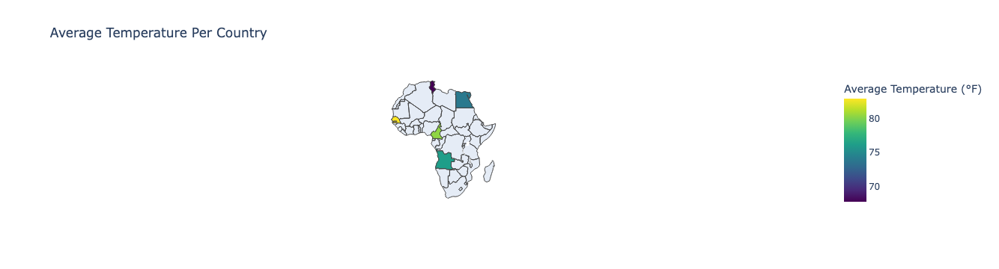

In [61]:
#Plotting the average temperature of the countries on a map using Plotly choropleth
fig = px.choropleth(avg_country_temp,
                    locations='country',
                    locationmode='country names',
                    scope='africa',
                    color='tavg',
                    hover_name='country',
                    title='Average Temperature Per Country',
                    color_continuous_scale='Viridis',
                    labels={'tavg': 'Average Temperature (°F)', 'country': 'Country'}
                   )
fig.show()

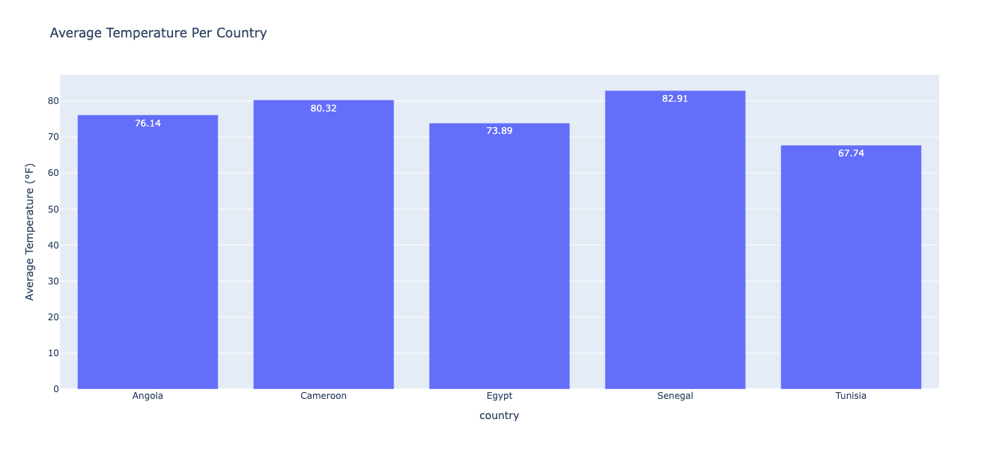

In [45]:
#Plotting the average temperature of the countries using a bar graph
fig = px.bar(avg_country_temp, x='country', y='tavg', text='tavg', title='Average Temperature Per Country', height=600, width=500)
fig.update_traces(texttemplate='%{text:.2f}')
fig.update_layout(yaxis_title='Average Temperature (°F)')
fig.show()

#### 3.2 Plot a scatter plot to show how the precipitation affects the temperature changes

In [38]:
#Get the annual average temperature and precipitation
avg_prcp_temp = df.groupby(['country','year']).agg({'prcp':'mean', 'tavg':'mean'}).reset_index()
avg_prcp_temp.head()

,country,year,prcp,tavg
0,Angola,1980,0.063062,77.029756
1,Angola,1981,0.059849,76.611965
2,Angola,1982,0.058617,76.850931
3,Angola,1983,0.026388,77.038866
4,Angola,1984,0.049260,77.030000


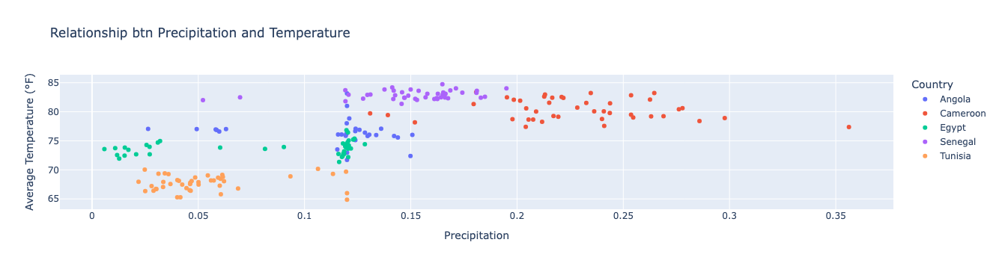

In [65]:
fig = px.scatter(avg_prcp_temp, title='Relationship btn Precipitation and Temperature', x=avg_prcp_temp.prcp ,y=avg_prcp_temp.tavg, color="country",
                labels={
                     "prcp": "Precipitation",
                     "tavg": "Temperature (°F)",
                    "country": "Country"
                 })
fig.update_layout(xaxis_title='Precipitation', yaxis_title='Average Temperature (°F)', legend_title_text='Country')
fig.show()

#### Interpretation of the temperature distribution and how it affects precipitation

* Countries with higher temperatures have higher rates of precipitation
* Average temperature in different countries seems to affect the rate of precipitation differently when compared to each other, therefore, we can assume that there are other factors other than temperature which affect precipitation